# Case 1-3 Demo Notebook

This notebook uses the representative case checkpoints
instead of the shared conditioned-family checkpoints. Each section:
1. loads one case checkpoint
2. runs a train-corrected rollout
3. shows a final-frame triptych
4. exports and embeds a GIF

The embedded GIFs are speed-oriented preview rollouts, not the most accurate
possible reconstructions. They trade some precision for faster computation.
You can continue tuning the rollout and model parameters to approach the
optimal Time-Evolving Neural Operator setting. For a more detailed tutorial,
see the UPT tutorial repository:
https://github.com/BenediktAlkin/upt-tutorial



In [1]:
from __future__ import annotations

from dataclasses import dataclass
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython import get_ipython
from IPython.display import Image as IPyImage
from IPython.display import display

ROOT = Path.cwd().resolve().parent if Path.cwd().resolve().name == "notebooks" else Path.cwd().resolve()
for candidate in (
    ROOT / "pof" / "90_archive" / "00_root_folder_archive" / "src",
    ROOT / "pof" / "scripts",
    ROOT / "teaching_force" / "src",
):
    if str(candidate) not in sys.path:
        sys.path.insert(0, str(candidate))

from pof_compare.full_rollout import load_trained_upt_model
from make_github_rollout_demos import (
    FIXED_TEST_START_TIMES,
    build_triangulation,
    extract_field,
    physical_time_to_saved_timestep,
    render_field,
    render_frame,
    render_timebar,
    run_rollout_with_train_correction,
    save_gif,
    saved_timestep_to_physical_time,
)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ip = get_ipython()
if ip is not None:
    ip.run_line_magic("matplotlib", "inline")
print("device:", DEVICE)


@dataclass(frozen=True)
class DemoCase:
    case_name: str
    label: str
    checkpoint: Path
    history: Path
    field_mode: str = "umag"
    frame_stride: int = 2
    fps: int = 10


CASES: tuple[DemoCase, ...] = (
    DemoCase(
        case_name="Case1",
        label="Case 1 | Re1000",
        checkpoint=ROOT / "teaching_force" / "reviewer_runs" / "case1_full_sampling_re1000" / "model.pt",
        history=ROOT / "teaching_force" / "reviewer_runs" / "case1_full_sampling_re1000" / "history.pt",
        field_mode="umag",
        frame_stride=2,
        fps=10,
    ),
    DemoCase(
        case_name="Case2",
        label="Case 2 | Re100",
        checkpoint=ROOT / "teaching_force" / "reviewer_runs" / "case2_full_sampling_re100" / "model.pt",
        history=ROOT / "teaching_force" / "reviewer_runs" / "case2_full_sampling_re100" / "history.pt",
        field_mode="umag",
        frame_stride=3,
        fps=10,
    ),
    DemoCase(
        case_name="Case3",
        label="Case 3 | JG=6 mm/s",
        checkpoint=ROOT / "teaching_force" / "reviewer_runs" / "case3_full_sampling_flow_0p006" / "model.pt",
        history=ROOT / "teaching_force" / "reviewer_runs" / "case3_full_sampling_flow_0p006" / "history.pt",
        field_mode="umag",
        frame_stride=2,
        fps=10,
    ),
)


def load_demo_model(case: DemoCase):
    return load_trained_upt_model(
        checkpoint_path=case.checkpoint,
        history_path=case.history,
        case_name=case.case_name,
        device=DEVICE,
        active_series_index=0,
    )


def run_case_rollout(case: DemoCase):
    loaded = load_demo_model(case)
    first_test_saved_timestep = physical_time_to_saved_timestep(
        case.case_name,
        FIXED_TEST_START_TIMES[case.case_name],
    )
    rollout = run_rollout_with_train_correction(
        loaded,
        num_steps=None,
        first_test_time=first_test_saved_timestep,
    )
    rollout["physical_times"] = [
        saved_timestep_to_physical_time(case.case_name, value)
        for value in rollout["times"]
    ]
    return loaded, rollout


def _frame_fields(*, case_name: str, positions, target, prediction, abs_error, field_mode: str):
    x, y, target_field = extract_field(case_name, positions, target, field_mode=field_mode)
    _, _, prediction_field = extract_field(case_name, positions, prediction, field_mode=field_mode)
    _, _, error_field = extract_field(case_name, positions, abs_error, field_mode=field_mode)
    return {
        "x": np.asarray(x, dtype=np.float32),
        "y": np.asarray(y, dtype=np.float32),
        "target": np.asarray(target_field, dtype=np.float32),
        "prediction": np.asarray(prediction_field, dtype=np.float32),
        "error": np.asarray(error_field, dtype=np.float32),
    }


def plot_triptych_frame(case: DemoCase, rollout: dict, *, frame_index: int = -1):
    frame_index = int(frame_index) % len(rollout["targets"])
    fields = _frame_fields(
        case_name=case.case_name,
        positions=np.asarray(rollout["positions"][frame_index], dtype=np.float32),
        target=np.asarray(rollout["targets"][frame_index], dtype=np.float32),
        prediction=np.asarray(rollout["predictions"][frame_index], dtype=np.float32),
        abs_error=np.asarray(rollout["abs_errors"][frame_index], dtype=np.float32),
        field_mode=case.field_mode,
    )
    all_target = []
    all_pred = []
    all_err = []
    for idx in range(len(rollout["targets"])):
        frame = _frame_fields(
            case_name=case.case_name,
            positions=np.asarray(rollout["positions"][idx], dtype=np.float32),
            target=np.asarray(rollout["targets"][idx], dtype=np.float32),
            prediction=np.asarray(rollout["predictions"][idx], dtype=np.float32),
            abs_error=np.asarray(rollout["abs_errors"][idx], dtype=np.float32),
            field_mode=case.field_mode,
        )
        all_target.append(frame["target"])
        all_pred.append(frame["prediction"])
        all_err.append(frame["error"])
    triangulation = build_triangulation(fields["x"], fields["y"])
    field_vmin = float(min(min(np.nanmin(v) for v in all_target), min(np.nanmin(v) for v in all_pred)))
    field_vmax = float(max(max(np.nanmax(v) for v in all_target), max(np.nanmax(v) for v in all_pred)))
    error_vmax = float(max(np.nanmax(v) for v in all_err))
    if error_vmax <= 0.0:
        error_vmax = 1.0

    fig = plt.figure(figsize=(13.8, 6.2), constrained_layout=True)
    gs = fig.add_gridspec(nrows=2, ncols=3, height_ratios=[18, 2.4])
    axes = [fig.add_subplot(gs[0, idx]) for idx in range(3)]
    bar_ax = fig.add_subplot(gs[1, :])
    gt_map = render_field(
        axes[0],
        x=fields["x"],
        y=fields["y"],
        values=fields["target"],
        triangulation=triangulation,
        render_mode="interp",
        vmin=field_vmin,
        vmax=field_vmax,
        cmap="viridis",
    )
    render_field(
        axes[1],
        x=fields["x"],
        y=fields["y"],
        values=fields["prediction"],
        triangulation=triangulation,
        render_mode="interp",
        vmin=field_vmin,
        vmax=field_vmax,
        cmap="viridis",
    )
    err_map = render_field(
        axes[2],
        x=fields["x"],
        y=fields["y"],
        values=fields["error"],
        triangulation=triangulation,
        render_mode="interp",
        vmin=0.0,
        vmax=error_vmax,
        cmap="magma",
    )
    for ax, title in zip(axes, ("Ground truth", "Prediction", "Absolute error"), strict=True):
        ax.set_aspect("equal")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(title, fontsize=13)
    fig.suptitle(case.label, fontsize=15)
    flow_cbar = fig.colorbar(gt_map, ax=axes[:2], shrink=0.90, pad=0.02)
    flow_cbar.set_label("Umag")
    err_cbar = fig.colorbar(err_map, ax=axes[2], shrink=0.90, pad=0.02)
    err_cbar.set_label("|pred - gt|")
    render_timebar(
        bar_ax,
        current_time=float(rollout["physical_times"][frame_index]),
        start_time=float(rollout["physical_times"][0]),
        end_time=float(rollout["physical_times"][-1]),
        test_start_time=float(FIXED_TEST_START_TIMES[case.case_name]),
    )
    return fig


def export_case_gif(case: DemoCase, rollout: dict, *, output_dir: Path):
    output_dir.mkdir(parents=True, exist_ok=True)
    all_target = []
    all_pred = []
    all_err = []
    positions_stack = []
    for idx in range(len(rollout["targets"])):
        frame = _frame_fields(
            case_name=case.case_name,
            positions=np.asarray(rollout["positions"][idx], dtype=np.float32),
            target=np.asarray(rollout["targets"][idx], dtype=np.float32),
            prediction=np.asarray(rollout["predictions"][idx], dtype=np.float32),
            abs_error=np.asarray(rollout["abs_errors"][idx], dtype=np.float32),
            field_mode=case.field_mode,
        )
        all_target.append(frame["target"])
        all_pred.append(frame["prediction"])
        all_err.append(frame["error"])
        positions_stack.append(np.column_stack([frame["x"], frame["y"]]).astype(np.float32))
    triangulation = build_triangulation(positions_stack[0][:, 0], positions_stack[0][:, 1])
    field_vmin = float(min(min(np.nanmin(v) for v in all_target), min(np.nanmin(v) for v in all_pred)))
    field_vmax = float(max(max(np.nanmax(v) for v in all_target), max(np.nanmax(v) for v in all_pred)))
    error_vmax = float(max(np.nanmax(v) for v in all_err))
    if error_vmax <= 0.0:
        error_vmax = 1.0
    frame_indices = list(range(0, len(all_target), int(case.frame_stride)))
    if frame_indices[-1] != len(all_target) - 1:
        frame_indices.append(len(all_target) - 1)
    frames = [
        render_frame(
            spec=type(
                "NotebookSpec",
                (),
                {"label": case.label, "field_mode": case.field_mode, "render_mode": "interp"},
            )(),
            positions=positions_stack[idx],
            target_values=all_target[idx],
            prediction_values=all_pred[idx],
            abs_error_values=all_err[idx],
            triangulation=triangulation,
            current_time=float(rollout["physical_times"][idx]),
            start_time=float(rollout["physical_times"][0]),
            end_time=float(rollout["physical_times"][-1]),
            test_start_time=float(FIXED_TEST_START_TIMES[case.case_name]),
            field_vmin=field_vmin,
            field_vmax=field_vmax,
            error_vmax=error_vmax,
        )
        for idx in frame_indices
    ]
    output_path = output_dir / f"{case.case_name.lower()}_demo.gif"
    save_gif(frames, output_path=output_path, fps=case.fps)
    print("saved:", output_path)
    return output_path




device: cpu


## Run All Three Demos



In [2]:
EXPORT_DIR = ROOT / "gif" / "notebook_demo_exports"
results = []
for case in CASES:
    loaded, rollout = run_case_rollout(case)
    results.append((case, loaded, rollout))
    print(case.label, loaded.checkpoint_path if hasattr(loaded, "checkpoint_path") else case.checkpoint)




Case 1 | Re1000 loaded


Case 2 | Re100 loaded


Case 3 | JG=6 mm/s loaded


## Final-Frame Triptychs



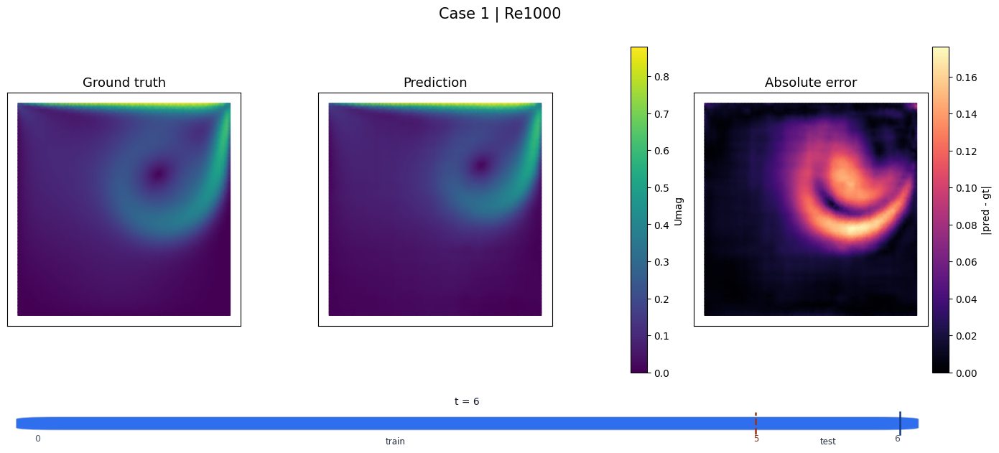

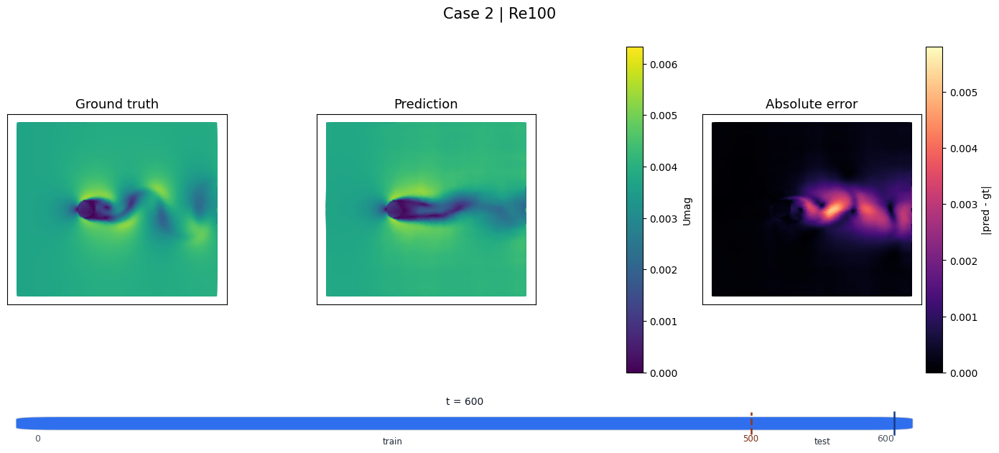

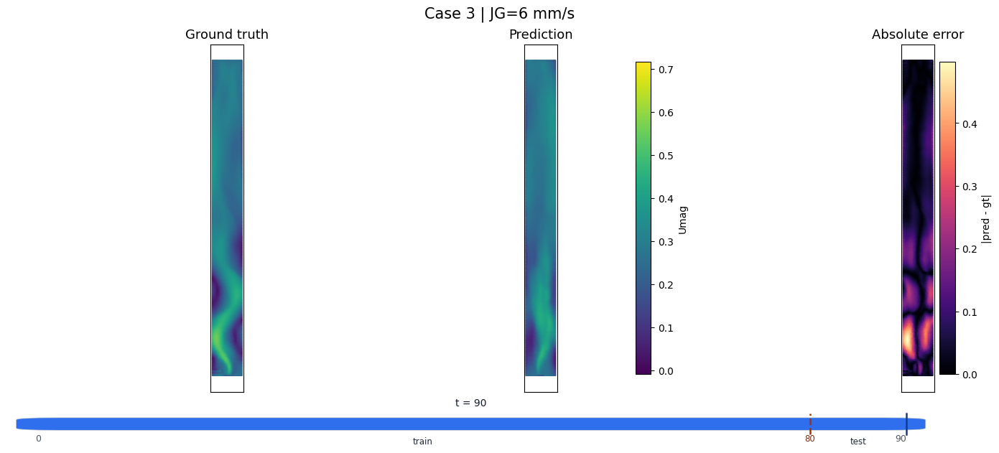

In [3]:
for case, loaded, rollout in results:
    fig = plot_triptych_frame(case, rollout, frame_index=-1)
    display(fig)
    plt.close(fig)




## GIF Exports

These GIFs prioritize fast preview generation over maximum reconstruction
accuracy. Further parameter tuning can improve the Time-Evolving Neural
Operator results; for a more detailed workflow, refer to the UPT tutorial
repository: https://github.com/BenediktAlkin/upt-tutorial



saved: case1_demo.gif


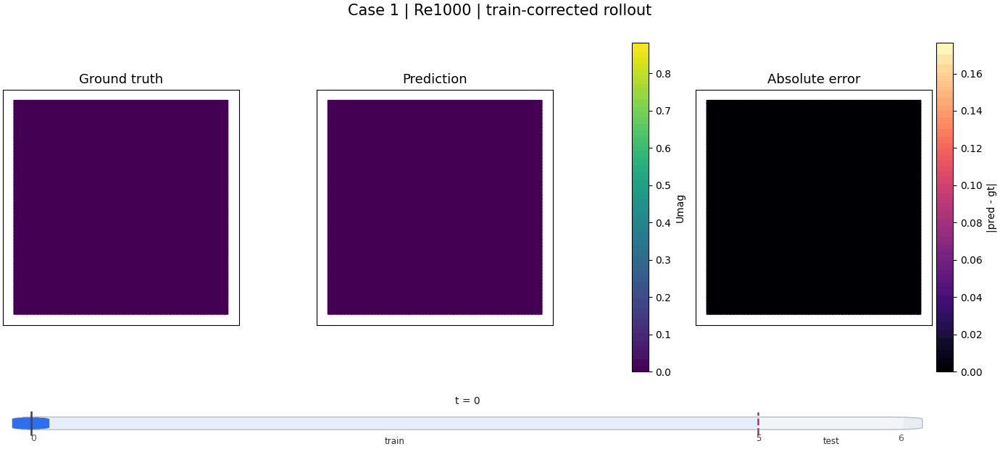

case1_demo.gif


saved: case2_demo.gif


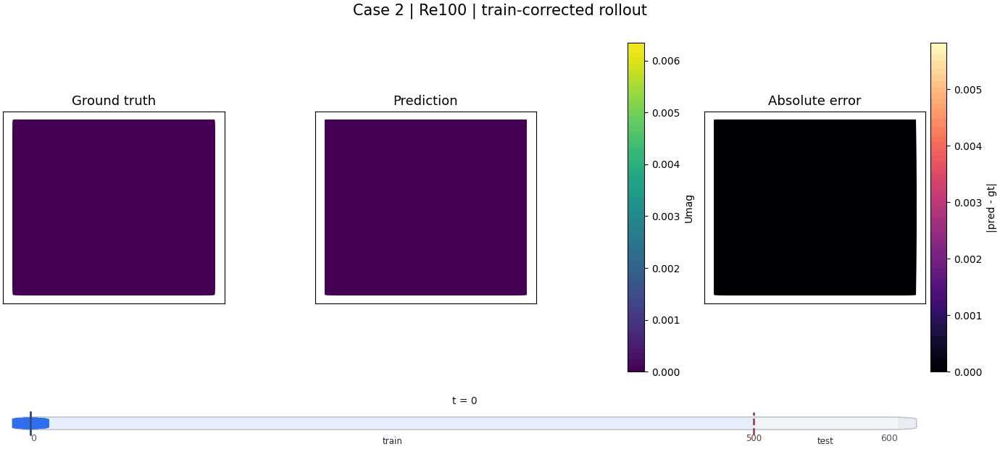

case2_demo.gif


saved: case3_demo.gif


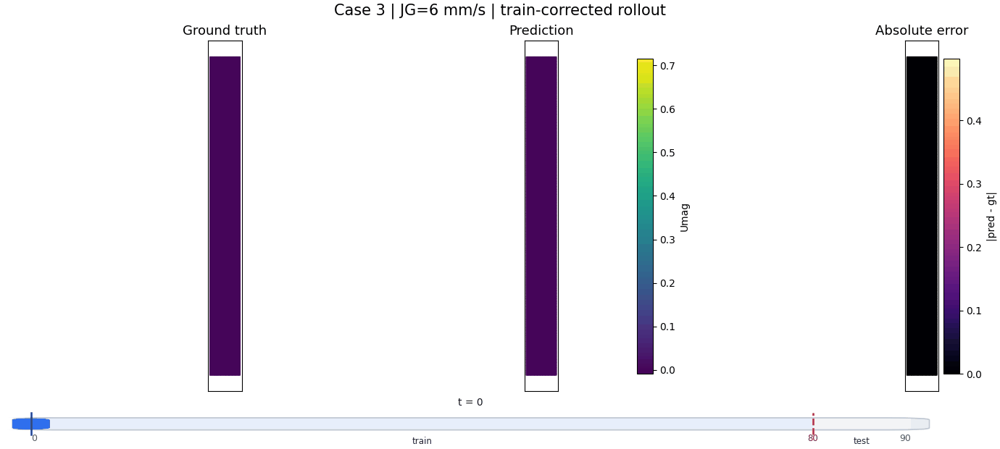

case3_demo.gif


In [4]:
for case, loaded, rollout in results:
    gif_path = export_case_gif(case, rollout, output_dir=EXPORT_DIR)
    display(IPyImage(filename=str(gif_path)))
    print(gif_path)
